In [1]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa
import tensorflow as tf
from sklearn.utils import class_weight
from sklearn.utils import compute_class_weight
from keras import regularizers

In [2]:
datadir = 'C:/Users/44942/MNA/Sim/beta_simulator_windows/simulator-windows-64/Images7'

columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']

data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)

data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\center_2023_06_24_07_29_15_271.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\left_2023_06_24_07_29_15_271.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\right_2023_06_24_07_29_15_271.jpg,0.0,0.0,0,0.000080
1,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\center_2023_06_24_07_29_15_375.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\left_2023_06_24_07_29_15_375.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\right_2023_06_24_07_29_15_375.jpg,0.0,0.0,0,0.000078
2,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\center_2023_06_24_07_29_15_476.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\left_2023_06_24_07_29_15_476.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\right_2023_06_24_07_29_15_476.jpg,0.0,0.0,0,0.000078
3,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\center_2023_06_24_07_29_15_581.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\left_2023_06_24_07_29_15_581.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\right_2023_06_24_07_29_15_581.jpg,0.0,0.0,0,0.000078
4,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\center_2023_06_24_07_29_15_688.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\left_2023_06_24_07_29_15_688.jpg,C:\Users\44942\MNA\Sim\beta_simulator_windows\simulator-windows-64\Images7\IMG\right_2023_06_24_07_29_15_688.jpg,0.0,0.0,0,0.000080


In [3]:
def path_leaf(path):
    # : This module provides os.path functionality on Windows platforms.
    # : ntpath.split() gives the file name and folder path
    head, tail = ntpath.split(path)
    return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_06_24_07_29_15_271.jpg,left_2023_06_24_07_29_15_271.jpg,right_2023_06_24_07_29_15_271.jpg,0.0,0.0,0,0.000080
1,center_2023_06_24_07_29_15_375.jpg,left_2023_06_24_07_29_15_375.jpg,right_2023_06_24_07_29_15_375.jpg,0.0,0.0,0,0.000078
2,center_2023_06_24_07_29_15_476.jpg,left_2023_06_24_07_29_15_476.jpg,right_2023_06_24_07_29_15_476.jpg,0.0,0.0,0,0.000078
3,center_2023_06_24_07_29_15_581.jpg,left_2023_06_24_07_29_15_581.jpg,right_2023_06_24_07_29_15_581.jpg,0.0,0.0,0,0.000078
4,center_2023_06_24_07_29_15_688.jpg,left_2023_06_24_07_29_15_688.jpg,right_2023_06_24_07_29_15_688.jpg,0.0,0.0,0,0.000080


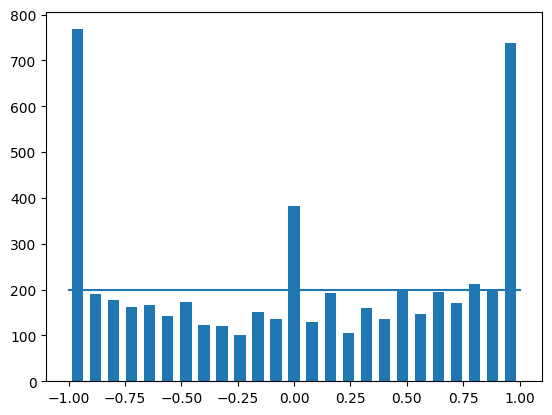

In [4]:
num_bins = 25

samples_per_bin = 200

hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 5383
removed: 1304
remaining: 4079


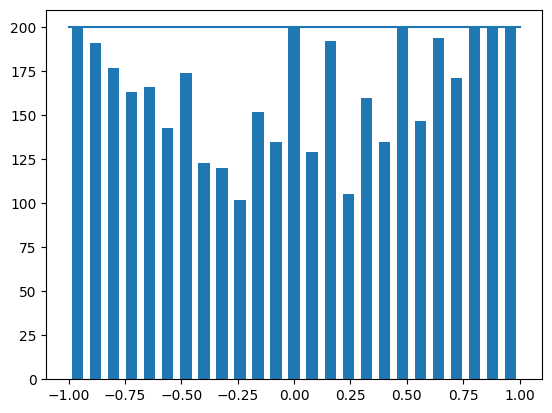

In [5]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [6]:
print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2023_06_24_07_29_15_375.jpg
left          left_2023_06_24_07_29_15_375.jpg
right        right_2023_06_24_07_29_15_375.jpg
steering                                   0.0
throttle                                   0.0
reverse                                      0
speed                                 0.000078
Name: 1, dtype: object


In [7]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3263
Valid Samples: 816


Text(0.5, 1.0, 'Validation set')

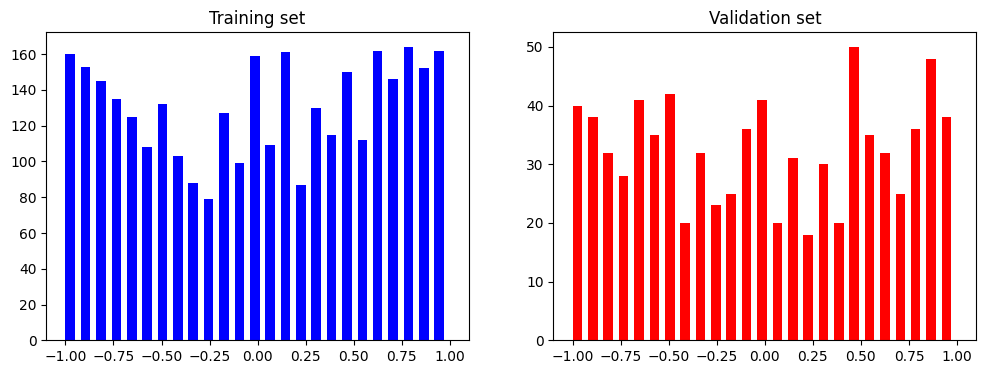

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

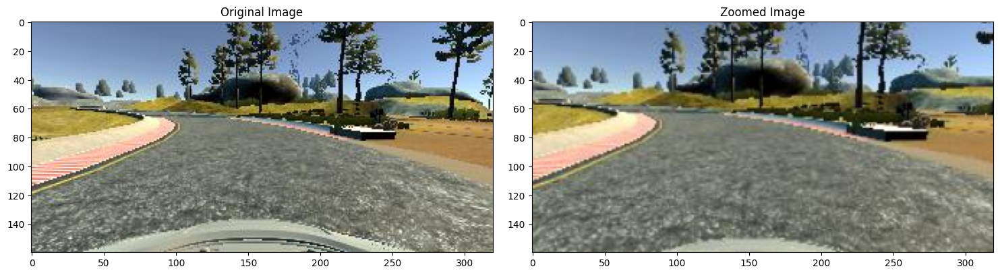

In [9]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image


image = image_paths[random.randint(0, len(image_paths) - 1)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

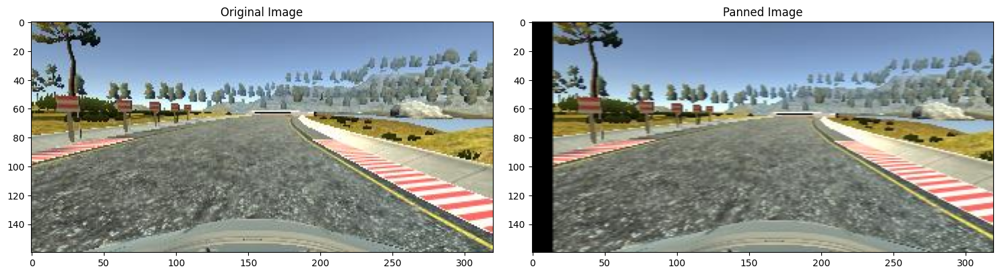

In [10]:
def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image


image = image_paths[random.randint(0, len(image_paths) - 1)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

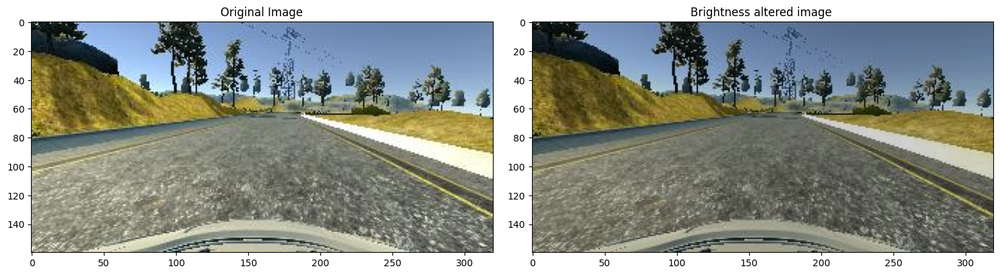

In [11]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, len(image_paths) - 1)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-1.0')

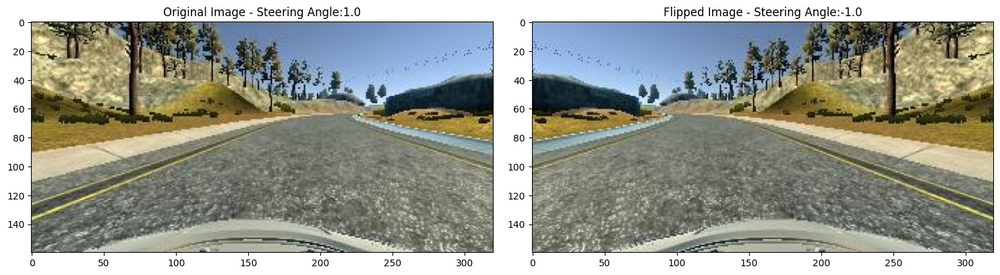

In [12]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle


random_index = random.randint(0, len(image_paths) - 1)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

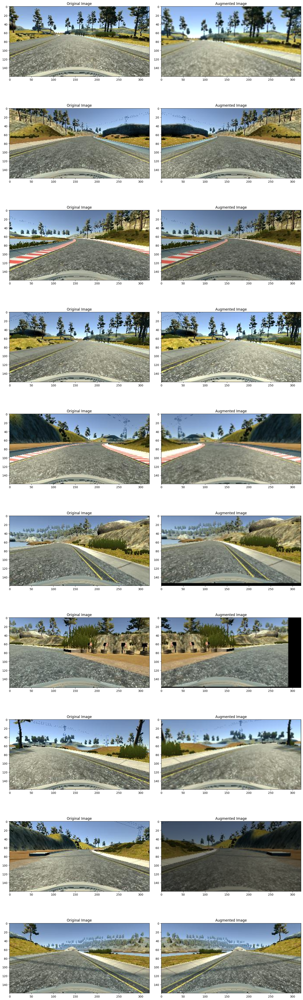

In [13]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle


ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

Text(0.5, 1.0, 'Preprocessed Image')

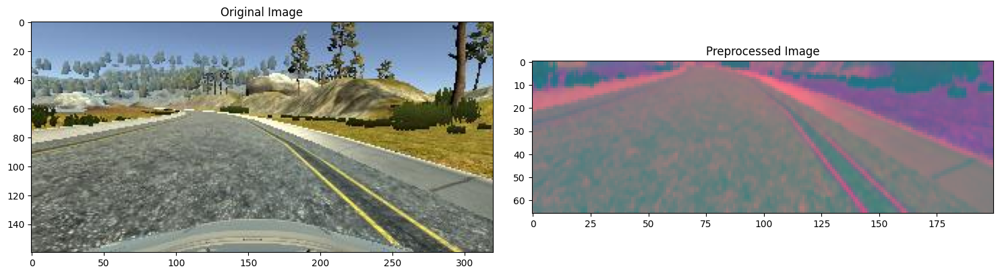

In [14]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [15]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            
            random_index = random.randint(0, len(image_paths) - 1)
           
            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]
            
            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

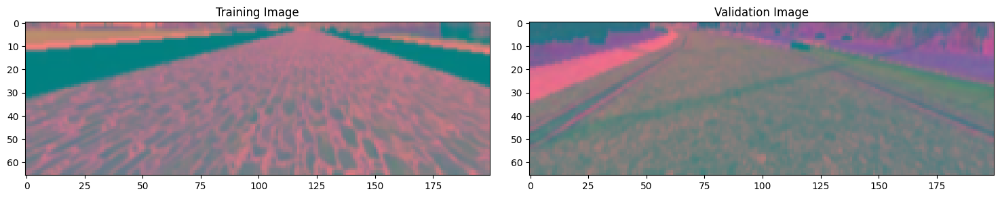

In [16]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [17]:
def nvidia_model():
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Convolution2D(3, (5, 5), strides=(1, 1), input_shape=(66, 200, 3), activation='relu'))
    model.add(tf.keras.layers.Convolution2D(3, (5, 5), strides=(1, 1), activation='relu',kernel_regularizer=regularizers.l2(0.001)))
    model.add(Dropout(0.25))
    model.add(tf.keras.layers.Convolution2D(24, (5, 5), strides=(1, 1), activation='relu'))
    model.add(Dropout(0.25))
    model.add(tf.keras.layers.Convolution2D(36, (5, 5), strides=(2, 2), activation='relu'))
    model.add(Dropout(0.25))
    model.add(tf.keras.layers.Convolution2D(48, (3, 3), strides=(2, 2), activation='relu'))
    model.add(tf.keras.layers.Convolution2D(64, (3, 3), strides=(2, 2), activation='relu'))
    model.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='relu'))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1164, activation='relu'))
    model.add(Dropout(0.25))
    model.add(tf.keras.layers.Dense(100, activation='relu'))
    model.add(Dropout(0.25))
    model.add(tf.keras.layers.Dense(50, activation='relu'))
    model.add(Dropout(0.25))
    model.add(tf.keras.layers.Dense(10, activation='relu',kernel_regularizer=regularizers.l2(0.001)))
    model.add(Dropout(0.25))
    model.add(tf.keras.layers.Dense(1, activation='linear'))
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [18]:
model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 196, 3)        228       
                                                                 
 conv2d_1 (Conv2D)           (None, 58, 192, 3)        228       
                                                                 
 dropout (Dropout)           (None, 58, 192, 3)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 54, 188, 24)       1824      
                                                                 
 dropout_1 (Dropout)         (None, 54, 188, 24)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 25, 92, 36)        21636     
                                                                 
 dropout_2 (Dropout)         (None, 25, 92, 36)        0

In [19]:
history = model.fit(batch_generator(X_train, y_train, 800, 1),
    steps_per_epoch=50,
    epochs=80,
    validation_data=batch_generator(X_valid, y_valid, 800, 0),
    validation_steps=50, 
    verbose=1,
    shuffle=True

)

Epoch 1/80
50/50 [==============================] - 434s 9s/step - loss: 0.3801 - val_loss: 0.3264
Epoch 2/80
50/50 [==============================] - 449s 9s/step - loss: 0.3371 - val_loss: 0.2648
Epoch 3/80
50/50 [==============================] - 399s 8s/step - loss: 0.2980 - val_loss: 0.2538
Epoch 4/80
50/50 [==============================] - 396s 8s/step - loss: 0.2821 - val_loss: 0.2486
Epoch 5/80
50/50 [==============================] - 394s 8s/step - loss: 0.2723 - val_loss: 0.2382
Epoch 6/80
50/50 [==============================] - 398s 8s/step - loss: 0.2630 - val_loss: 0.2353
Epoch 7/80
50/50 [==============================] - 399s 8s/step - loss: 0.2579 - val_loss: 0.2285
Epoch 8/80
50/50 [==============================] - 403s 8s/step - loss: 0.2479 - val_loss: 0.2255
Epoch 9/80
50/50 [==============================] - 406s 8s/step - loss: 0.2419 - val_loss: 0.2244
Epoch 10/80
50/50 [==============================] - 406s 8s/step - loss: 0.2416 - val_loss: 0.2183
Epoch 11/

Text(0.5, 0, 'Epoch')

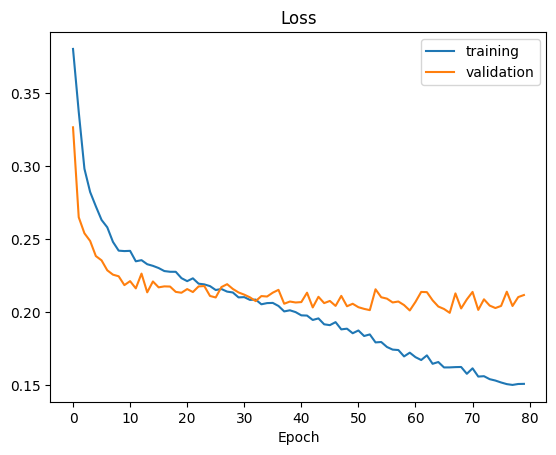

In [20]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [21]:
model.save('model2.h5')